Bringing over all code from Data Wrangling Notebook

In [107]:
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas_profiling
from scipy import stats
import numpy as np
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster


import warnings
warnings.filterwarnings('ignore')
import math
import time

In [15]:
#Input data
wells = pd.read_csv('InjectionWells.csv')
earthquakes = pd.read_csv('okQuakes.csv')

wells = wells[wells['LAT'].notna()]
wells = wells[wells['LONG'].notna()]

#Turn time column into datetime format, remove hour information to match up with the wells dataset, set time as the index
earthquakes['time'] = pd.to_datetime(earthquakes['time'])
earthquakes['Date'] = earthquakes['time'].dt.date
earthquakes = earthquakes.set_index('Date')
earthquakes.index = pd.to_datetime(earthquakes.index)

wells['Date'] = pd.to_datetime(wells['Approval Date'])
wells = wells.set_index('Date')
wells.sort_index()

wells['temp'] = '2016-09-20'
wells['temp'] = pd.to_datetime(wells['temp'])
wells['Days Active'] = wells['temp'] - wells.index
wells = wells.drop(['temp'], axis=1)

wells['PSI'] = wells['PSI'].replace(',','', regex=True)
wells['BBLS'] = wells['BBLS'].replace(',','', regex=True)
wells['BBLS'] = wells['BBLS'].replace('V-1600 CH 300', '300', regex=True)
wells['PSI'] = wells['PSI'].replace('V-2000 CH 1700', '1700', regex=True)

temp = wells.loc[wells['PSI'].isin(['224B/475G','226B/479G', '226B/479G','222B/470G', '235B/498G', '197B/416G',
       '225B/476G', '225B/475G', '223B/472G', '204B/432G', '223B/471G'  
    '228B/483G', '229B/484G', '229B/486G', '236B/499G', '230B/487G',
       '202B/428G', '226B/478G', '227B/481G', '218B/461G', '227B/480G','219B/464G','223B/471G', '228B/483G'])]

wells =  wells.loc[~wells['PSI'].isin(['224B/475G','226B/479G', '226B/479G','222B/470G', '235B/498G', '197B/416G',
       '225B/476G', '225B/475G', '223B/472G', '204B/432G', '223B/471G'  
    '228B/483G', '229B/484G', '229B/486G', '236B/499G', '230B/487G',
       '202B/428G', '226B/478G', '227B/481G', '218B/461G', '227B/480G','219B/464G','223B/471G', '228B/483G',])]

wells['PSI'] = wells['PSI'].astype(float)
temp['PSI1'] = '750'
temp = temp.drop(['PSI'], axis=1)
temp.rename(columns = {'PSI1':'PSI'}, inplace = True)
temp['PSI'] = temp['PSI'].astype(float)

wells = pd.concat([wells, temp])
wells['BBLS'] = wells['BBLS'].astype(float)

wells = wells.drop(['API#', 'Operator', 'Operator ID', 'WellType', 'WellName', 'WellNumber', 'OrderNumbers', 'Sec', 'Twp', 'Rng', 'QQQQ', 'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20'], axis=1)
wells = wells.drop(['Approval Date'], axis=1)

wells.rename(columns = {'LAT':'Latitude', 'LONG':'Longitude'}, inplace = True)
wells = wells.drop_duplicates()
wells['PSI'] = wells['PSI'].fillna(750.0)
wells['BBLS'] = wells['BBLS'].fillna(1100)

psi_high = wells['PSI'].mean() + 3 * wells['PSI'].std()
psi_low = wells['PSI'].mean() - 3 * wells['PSI'].std()
bbls_high = wells['BBLS'].mean() + 3 * wells['BBLS'].std()
bbls_low = wells['BBLS'].mean() - 3 * wells['BBLS'].std()

wells = wells[(wells['PSI'] < psi_high) & (wells['PSI'] > psi_low)]
wells = wells[(wells['BBLS'] < bbls_high) & (wells['BBLS'] > bbls_low)]

wells['Yearly Volume'] = wells['BBLS'] * 365
wells.rename(columns = {'BBLS':'Daily Volume'}, inplace = True)

earthquakes = earthquakes.drop(['nst', 'magType', 'dmin', 'net', 'updated', 'horizontalError', 'depthError', 'magError', 'magNst', 'status', 'locationSource', 'magSource'], axis=1)
earthquakes = earthquakes.drop(['gap'], axis=1)
earthquakes = earthquakes.drop(['time'], axis=1)
earthquakes = earthquakes.drop(['id', 'place'], axis=1)

earthquakes = earthquakes.loc[~earthquakes['type'].isin(['explosion', 'rock burst', 'mining explosion', 'mine collapse'])]
earthquakes.rename(columns = {'latitude':'Latitude', 'longitude':'Longitude', 'depth':'Depth', 'mag':'Magnitude', 'rms':'Velocity', 'type':'Type'}, inplace = True)

earthquakes['Magnitude'] = earthquakes['Magnitude'].fillna(2.6)
earthquakes['Velocity'] = earthquakes['Velocity'].fillna(0.4)

wells = wells[(wells['Longitude']>=-101.5)&(wells['Longitude']<=-93.5)&
                        (wells['Latitude']>=33.5)&(wells['Latitude']<=37.5)]

earthquakes = earthquakes[(earthquakes['Longitude']>=-101.5)&(earthquakes['Longitude']<=-93.5)&
                        (earthquakes['Latitude']>=33.5)&(earthquakes['Latitude']<=37.5)]
wells = wells.sort_index()
earthquakes = earthquakes.sort_index()

wells['Wells Frequency'] = 1
earthquakes['Earthquakes Frequency'] = 1

wells = wells.drop(['County'], axis=1)


In [3]:
map_earthquakes = folium.Map( location=[35.207878,-96.849979], zoom_start=7)

earthquakes.apply(lambda row:folium.Circle(location=[row["Latitude"], row['Longitude']],radius=5, color= 'red', fill_opacity=0.6).add_to(map_earthquakes), axis=1)
wells.apply(lambda row:folium.Circle(location=[row["Latitude"], row['Longitude']],radius=5, color= 'blue', fill_opacity=0.6).add_to(map_earthquakes), axis=1)

map_earthquakes

In [21]:
earthquakes.head()

,Latitude,Longitude,Depth,Magnitude,Velocity,Type,Earthquakes Frequency
Date,,,,,,,
1974-02-15,36.500,-100.693,24.0,4.5,0.4,earthquake,1
1974-12-16,35.330,-97.480,10.0,2.6,0.4,earthquake,1
1975-09-13,34.139,-97.369,5.0,3.4,0.4,earthquake,1
1975-10-12,34.816,-97.406,20.0,3.2,0.4,earthquake,1
1975-11-29,34.521,-97.347,5.0,3.5,0.4,earthquake,1


In [159]:
wells_resamp = wells.resample('D').mean()
earthquakes_resamp = earthquakes.resample('D').mean()
wells_resamp['Wells Frequency'] = wells['Wells Frequency'].resample('D').sum()
earthquakes_resamp['Earthquakes Frequency'] = earthquakes['Earthquakes Frequency'].resample('D').sum()

wells_resamp = wells_resamp.drop(['Latitude', 'Longitude'], axis=1)
wells_resamp['Type'] = 'Injection Well'
earthquakes_resamp = earthquakes_resamp.drop(['Latitude', 'Longitude'], axis=1)
earthquakes_resamp['Type'] = 'Earthquake'

wells_resamp['Depth'] = 0
wells_resamp['Magnitude'] = 0
wells_resamp['Velocity'] = 0

earthquakes_resamp['PSI'] = 0
earthquakes_resamp['Daily Volume'] = 0
earthquakes_resamp['Yearly Volume'] = 0

wells_resamp = wells_resamp.dropna()
earthquakes_resamp = earthquakes_resamp.dropna()

In [160]:
earthquakes_resamp.tail(40)

,Depth,Magnitude,Velocity,Earthquakes Frequency,Type,PSI,Daily Volume,Yearly Volume
Date,,,,,,,,
2016-08-11,5.818500,2.387500,0.240000,4,Earthquake,0,0,0
2016-08-12,6.175429,2.608571,0.218571,7,Earthquake,0,0,0
2016-08-13,6.830000,2.103333,0.183333,3,Earthquake,0,0,0
2016-08-14,5.699250,3.025000,0.532500,4,Earthquake,0,0,0
2016-08-15,6.123500,2.415000,0.317500,4,Earthquake,0,0,0
2016-08-16,6.519200,3.040000,0.456000,5,Earthquake,0,0,0
2016-08-17,6.057200,2.920000,0.329000,10,Earthquake,0,0,0
2016-08-18,5.358000,2.800000,0.255000,2,Earthquake,0,0,0
2016-08-19,4.841667,2.280000,0.393333,3,Earthquake,0,0,0


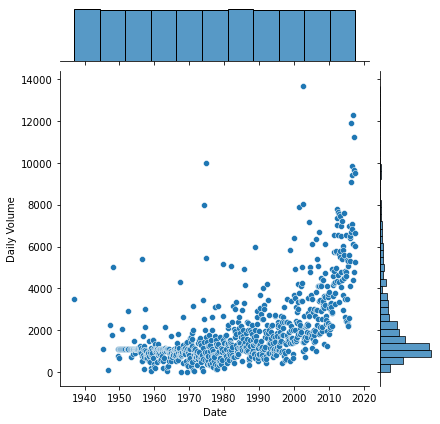

In [7]:
axs = sns.jointplot('Date', 'Daily Volume', data=wells_resamp)

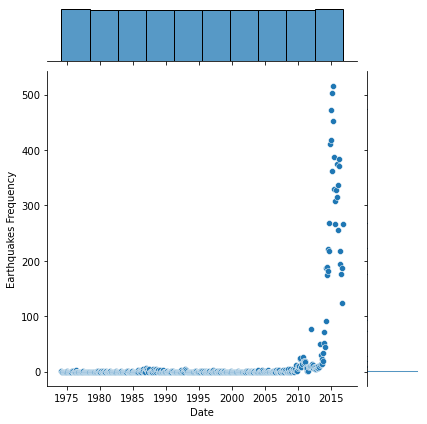

In [9]:
axs = sns.jointplot('Date', 'Earthquakes Frequency', data=earthquakes_resamp)

plt.show()

In [161]:
merge_resamp = pd.concat([wells_resamp,earthquakes_resamp])
merge_resamp = merge_resamp.sort_index()
merge_resamp['Earthquakes Frequency'] = merge_resamp['Earthquakes Frequency'].fillna(0) 
merge_resamp['Wells Frequency'] = merge_resamp['Wells Frequency'].fillna(0)

In [162]:
merge_resamp.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5895 entries, 1936-12-18 to 2017-08-30
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PSI                    5895 non-null   float64
 1   Daily Volume           5895 non-null   float64
 2   Yearly Volume          5895 non-null   float64
 3   Wells Frequency        5895 non-null   float64
 4   Type                   5895 non-null   object 
 5   Depth                  5895 non-null   float64
 6   Magnitude              5895 non-null   float64
 7   Velocity               5895 non-null   float64
 8   Earthquakes Frequency  5895 non-null   float64
dtypes: float64(8), object(1)
memory usage: 460.5+ KB


In [64]:
merge_onehot = pd.get_dummies(merge_resamp, columns = ['Type'])

In [65]:
merge_onehot.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2962 entries, 1936-12-20 to 2017-09-03
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PSI                    2962 non-null   float64
 1   Daily Volume           2962 non-null   float64
 2   Yearly Volume          2962 non-null   float64
 3   Wells Frequency        2962 non-null   float64
 4   Depth                  2962 non-null   float64
 5   Magnitude              2962 non-null   float64
 6   Velocity               2962 non-null   float64
 7   Earthquakes Frequency  2962 non-null   float64
 8   Type_Earthquake        2962 non-null   uint8  
 9   Type_Injection Well    2962 non-null   uint8  
dtypes: float64(8), uint8(2)
memory usage: 214.1 KB


In [78]:
import keras_tuner as kt
from tensorflow import keras

from keras_tuner import RandomSearch
from tensorflow import keras
from tensorflow.keras import layers, losses, metrics, optimizers
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from keras.models import Sequential
from keras.layers import Dense
from keras_tuner.tuners import Hyperband

In [70]:
X_train.shape

(2777, 9)

In [182]:
tss = TimeSeriesSplit(n_splits = 2)
X = merge_onehot.drop(['Earthquakes Frequency'], axis=1)
y = merge_onehot['Earthquakes Frequency']
for train_index, test_index in tss.split(X):
    X_train, X_test = X.iloc[train_index, :], X.iloc[test_index,:]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [100]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=25)

In [188]:
model1 = Sequential()
model1.add(Dense(1500,activation='relu'))
model1.add(Dense(1500,activation='relu'))
model1.add(Dense(1))
model1.compile(optimizer='adam', loss='mse',metrics=['accuracy'])

In [189]:
model1.fit(X_train,y_train, epochs=11)

Epoch 1/11

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

62/62 [==============================] - 2s 37ms/step - loss: 6137549824.0000 - accuracy: 0.5129
Epoch 2/11
62/62 [==============================] - 2s 32ms/step - loss: 7501533.0000 - accuracy: 0.5833
Epoch 3/11
62/62 [==============================] - 2s 34ms/step - loss: 107604.7891 - accuracy: 0.4881
Epoch 4/11
62/62 [==============================] - 2s 33ms/step - loss: 5653.3486 - accuracy: 0.3635
Epoch 5/11
62/62 [==============================] - 2s 34ms/step - loss: 2272.7871 - accu

In [190]:
# Evaluate the best model.
loss, accuracy = model1.evaluate(X_test, y_test)

31/31 [==============================] - 0s 7ms/step - loss: 694429568.0000 - accuracy: 0.6960


In [183]:
def build_model(hp):
    model = Sequential()
    model.add(Dense(
        units=hp.Int(
        'units1',
        min_value=32,
        max_value=1024,
        step=16,
        default=128
        ),
        activation=hp.Choice(
        'dense_activation1',
        values=['relu', 'tanh', 'sigmoid'],
        default='relu'
        )
        ))
    model.add(Dense(
        units=hp.Int(
        'units2',
        min_value=32,
        max_value=1024,
        step=16,
        default=128
        ),
        activation=hp.Choice(
        'dense_activation2',
        values=['relu', 'tanh', 'sigmoid'],
        default='relu'
        )
        ))
    model.add(Dense(1))
    model.compile(
            optimizer=keras.optimizers.Adam(
                hp.Float(
                    'learning_rate',
                    min_value=1e-4,
                    max_value=1e-2,
                    sampling='LOG',
                    default=1e-3
                )
            ),
            loss='mse',
            metrics=['accuracy']
        )
    return model

In [185]:
tuner = Hyperband(
    build_model,
    max_epochs=20,
    objective='val_accuracy',
    seed=1,
    executions_per_trial=5,
    directory=os.path.normpath('C:/'),
    overwrite = True,
    project_name='earthquakes'
)

In [186]:
start = time.time()
tuner.search(X_train, y_train, epochs=40, validation_split=0.2)
print('It takes %s minutes' % ((time.time() - start)/60))

Trial 30 Complete [00h 00m 25s]
val_accuracy: 0.9924050569534302

Best val_accuracy So Far: 0.9924050569534302
Total elapsed time: 00h 08m 44s
INFO:tensorflow:Oracle triggered exit
It takes 8.750723191102345 minutes


In [187]:
# Show a summary of the search
#tuner.results_summary()

# Retrieve the best model.
best_model = tuner.get_best_models(num_models=1)[0]

# Evaluate the best model.
loss, accuracy = best_model.evaluate(X_test, y_test)


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

31/31 [==============================] - 0s 2ms/step - loss: 775.1243 - accuracy: 0.6940


https://www.sicara.ai/blog/hyperparameter-tuning-keras-tuner

In [191]:
y_pred = best_model.predict(X_train)